In [16]:
#IMPORTING ALL NECESSARY LIBRARIES
import numpy as np                  # LINEAR ALGEBRA
import pandas as pd                 # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt     # Data Viz
import seaborn as sns
import plotly.express as px         # Data viz-Geospatial
%matplotlib inline
import warnings                     # Warnings
warnings.filterwarnings('ignore')   # Hides warning popups

In [4]:
covid = pd.read_csv('/Users/karankalambuskar/Downloads/linearregression.csv')

In [5]:
covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100416 entries, 0 to 100415
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   location             100416 non-null  object 
 1   date                 100416 non-null  object 
 2   variant              100416 non-null  object 
 3   num_sequences        100416 non-null  int64  
 4   perc_sequences       100416 non-null  float64
 5   num_sequences_total  100416 non-null  int64  
dtypes: float64(1), int64(2), object(3)
memory usage: 4.6+ MB


In [6]:
##RENAME SOME COLOUMNS NAME
covid.rename(columns={"location":"country","variant":"variant_type", "num_sequences":"case_each_day", "num_sequences_total":"total_number_of_case"} , inplace = True)

In [7]:
covid.head()

,country,date,variant_type,case_each_day,perc_sequences,total_number_of_case
0,Angola,2020-07-06,Alpha,0,0.0,3
1,Angola,2020-07-06,B.1.1.277,0,0.0,3
2,Angola,2020-07-06,B.1.1.302,0,0.0,3
3,Angola,2020-07-06,B.1.1.519,0,0.0,3
4,Angola,2020-07-06,B.1.160,0,0.0,3


In [8]:
covid.variant_type.unique()

array(['Alpha', 'B.1.1.277', 'B.1.1.302', 'B.1.1.519', 'B.1.160',
       'B.1.177', 'B.1.221', 'B.1.258', 'B.1.367', 'B.1.620', 'Beta',
       'Delta', 'Epsilon', 'Eta', 'Gamma', 'Iota', 'Kappa', 'Lambda',
       'Mu', 'Omicron', 'S:677H.Robin1', 'S:677P.Pelican', 'others',
       'non_who'], dtype=object)

In [9]:
covid['date'] = pd.to_datetime(covid['date'])

In [10]:
covid['month'] = covid['date'].dt.month
covid['day'] = covid['date'].dt.day

### Maximum Number of Cases are in America,UK,Germany

In [11]:
pd.options.display.max_rows = None
top_20 = covid.groupby(['country'])['total_number_of_case'].sum().sort_values(ascending = False).reset_index().head(20)

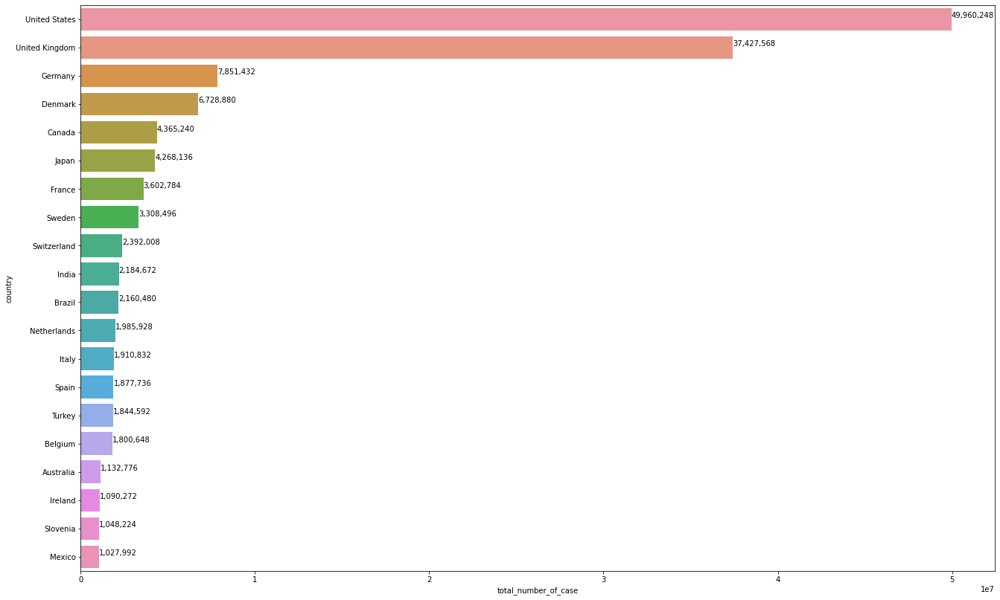

In [12]:
### Generate a Barplot
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize=(22,14))
plot = sns.barplot(top_20['total_number_of_case'], top_20['country'])
for i,(value,name) in enumerate(zip(top_20['total_number_of_case'],top_20['country'])):
    plot.text(value,i-0.05,f'{value:,.0f}',size=10)
plt.show()

The Graph above shows that which variant of Covid-19 widely spread for each country**

In US Alpha variant effect so much

In UK three variant is effected B.1.1.519 , Aplha , B.1.1.177.

In Denmark B.1.1.277 and in sweden B.1.1.277 variant effect so much

In France and Switzerland B.1.1.160 variant graph are so high

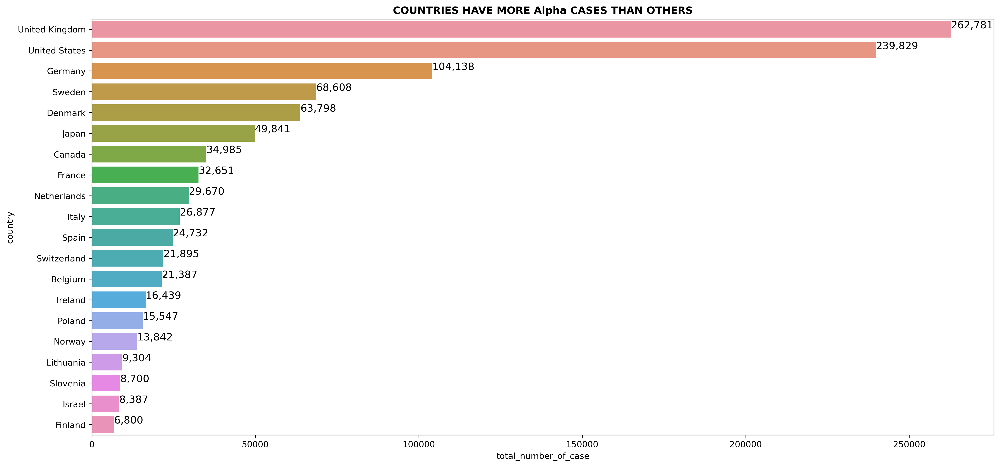

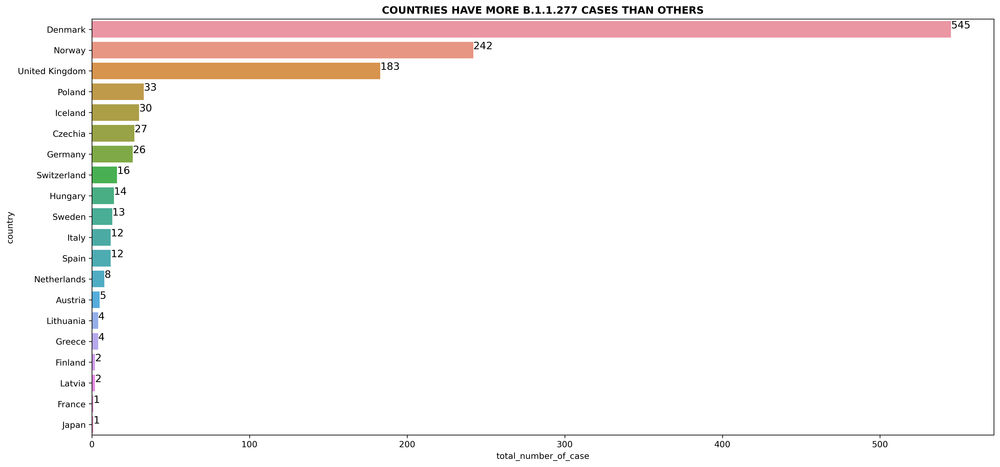

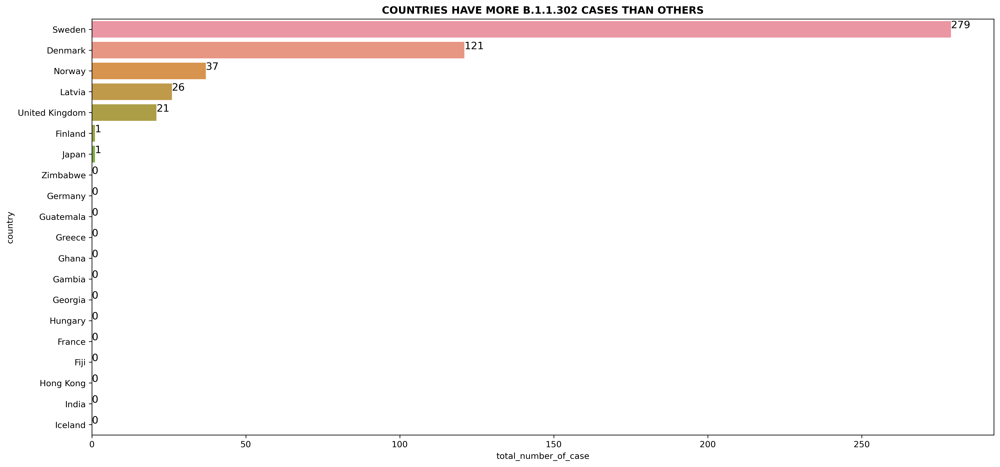

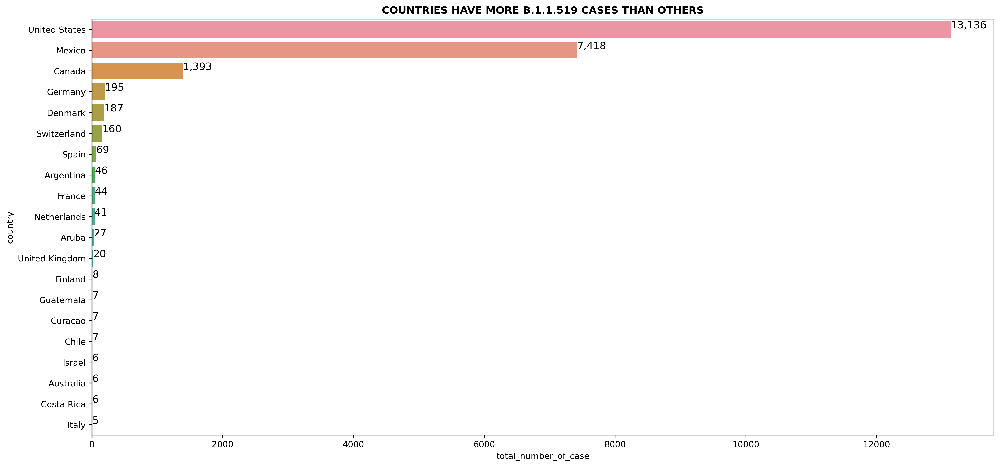

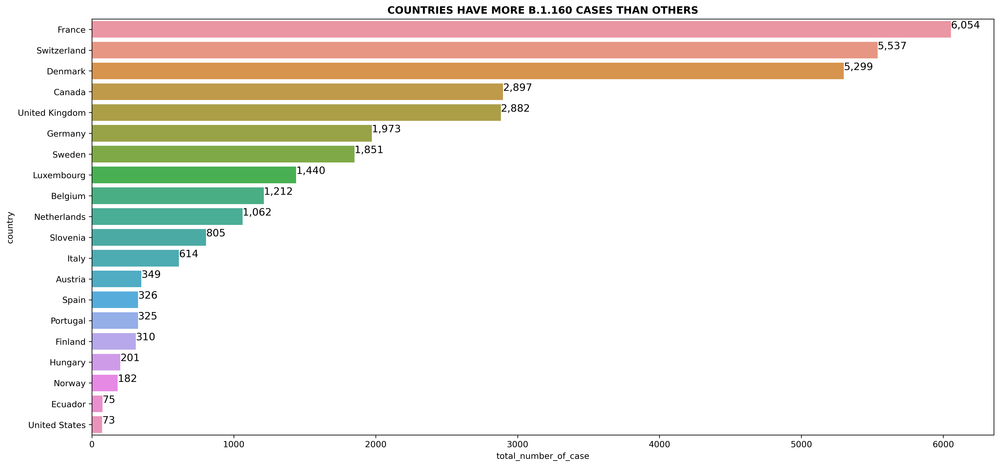

...

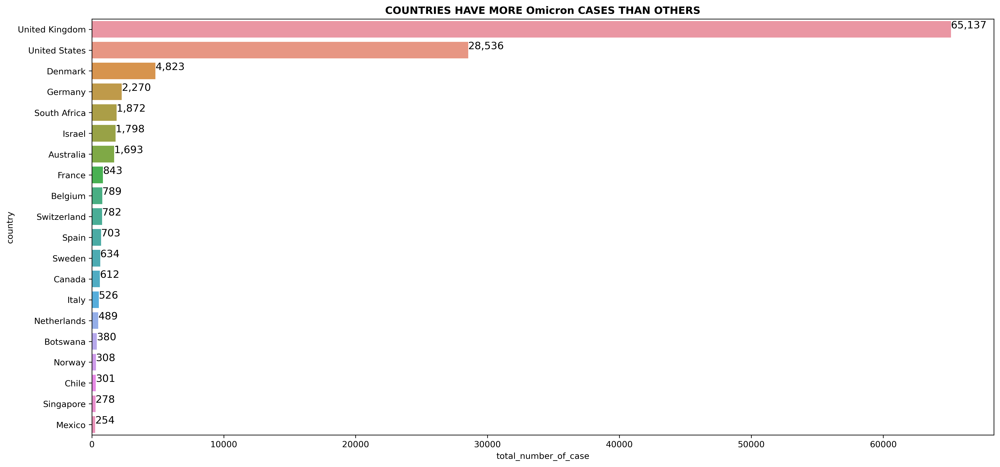

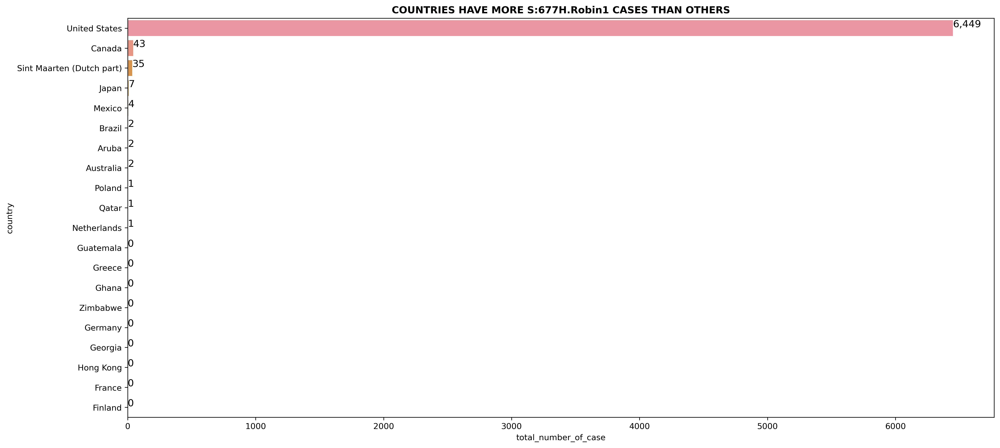

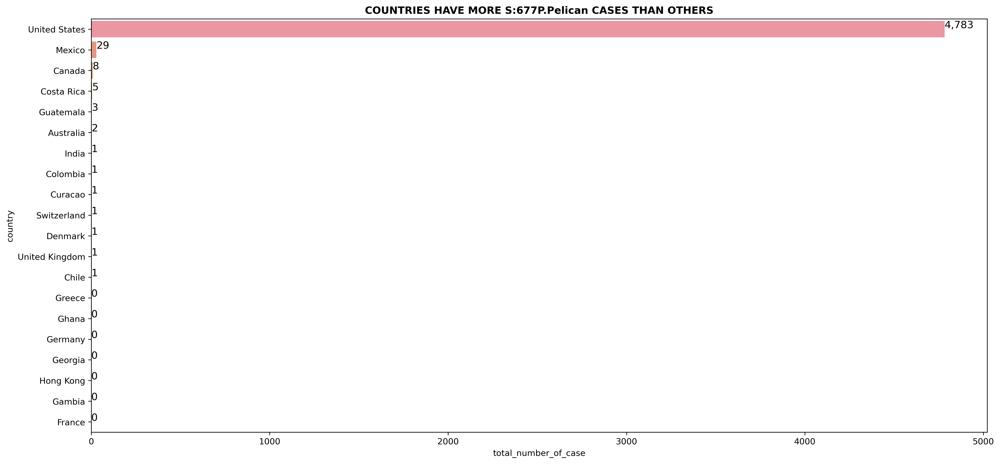

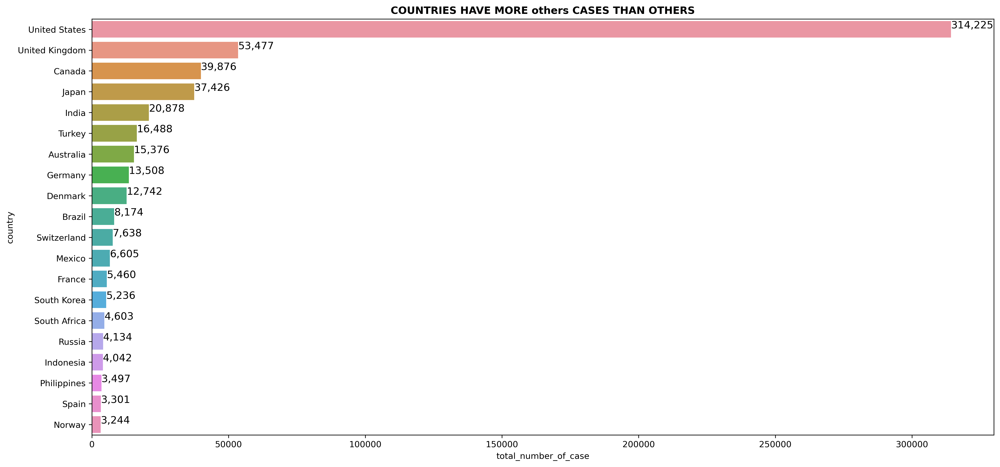

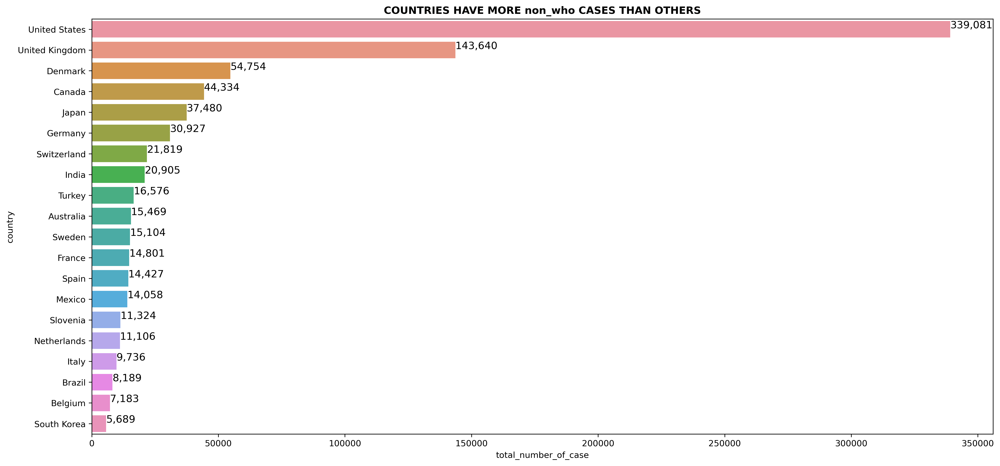

In [13]:
#COMPARING VARIANTS WITH EACH OTHER
for l in covid.variant_type.unique():
    df = covid[covid['variant_type'] == l].groupby('country')['case_each_day'].agg('sum').sort_values(ascending=False).head(20)
    df = pd.DataFrame({'country':df.index, 'total_number_of_case':df.values})
    plt.figure(figsize=(19,9),dpi=300)
    plot = sns.barplot(df["total_number_of_case"] , df['country'])
    for i,(value,name) in enumerate(zip(df['total_number_of_case'],df['country'])):
        plot.text(value,i-0.05,f'{value:,.0f}',size=12)
    plt.title('COUNTRIES HAVE MORE {} CASES THAN OTHERS'.format(l),loc='center',fontweight="bold")

In [14]:
figure = px.choropleth(top_20,locations='country', locationmode= 'country names', color= 'total_number_of_case', 
                       hover_name='country', color_continuous_scale='tealgrn', 
                       range_color=[1,1000000],title='Countries with Highest Number of CovidCases(GEOSPATIAL ANAYSIS)')
figure.show()